# Introduction to Deep Learning
## Assignment 1, Part 3

### Generative Models

<img src="https://lilianweng.github.io/lil-log/assets/images/three-generative-models.png" width="500">


In this notebook we are going to cover two generative models for generating novel images:

1. Variational Autoencoders (VAEs)
2. Generative adversarial networks (GANs)

Your main goal will be to retrain these models on a dataset of your choice and do some experiments on the learned latent space.

You should first copy this notebook and enable GPU runtime in 'Runtime -> Change runtime type -> Hardware acceleration -> GPU **OR** TPU'.


In [1]:
from tqdm import tqdm
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

from google.colab import drive
drive.mount('/content/drive', force_remount=True)


Mounted at /content/drive


In [ ]:
#!wget https://surfdrive.surf.nl/files/index.php/s/62Lnr1AtGe9b0v9/download -O face_dataset_64x64.npy

--2023-10-25 15:27:17--  https://surfdrive.surf.nl/files/index.php/s/62Lnr1AtGe9b0v9/download
Resolving surfdrive.surf.nl (surfdrive.surf.nl)... 145.100.27.67, 145.107.8.140, 2001:610:108:203b:0:a11:da7a:5afe, ...
Connecting to surfdrive.surf.nl (surfdrive.surf.nl)|145.100.27.67|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 503083136 (480M) [application/octet-stream]
Saving to: ‘face_dataset_64x64.npy’

face_dataset_64x64. 100%[===================>] 479.78M  29.8MB/s    in 19s     

2023-10-25 15:27:36 (25.9 MB/s) - ‘face_dataset_64x64.npy’ saved [503083136/503083136]




### Dataset

This dataset is called [Flickr-Faces-HQ Dataset](https://github.com/NVlabs/ffhq-dataset). Here we will use a downsampled version of it (64x64x3) that will speed up all the experiments. [Download](https://surfdrive.surf.nl/files/index.php/s/LXBrnGGvUISlckW).

After downloading you should copy it to your google drive's main directory (or modify the code to load it from elsewhere).

After running the notebook on this default dataset you then need to find a dataset of your own.

In [ ]:
X = np.load('/content/drive/My Drive/Colab Notebooks/pokemon_array.npy',  fix_imports=True,encoding='latin1')[:20000, :, :, :]


array([[[[1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         ...,
         [1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ]],

        [[1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         ...,
         [1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ]],

        [[1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         ...,
         [1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ]],

        ...,

        [[1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ]

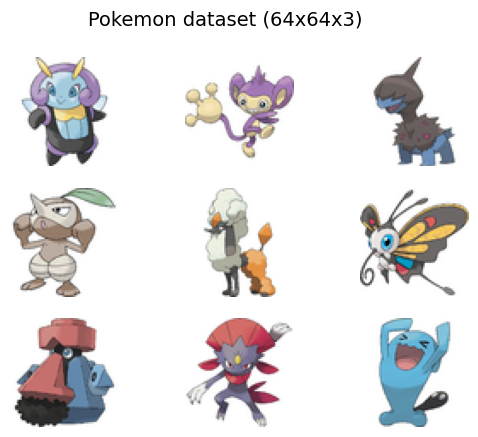

In [2]:
def load_real_samples(scale=False):
    # We load 20,000 samples only to avoid memory issues, you can  change this value
    X = np.load('/content/drive/My Drive/Colab Notebooks/pokemon_array.npy',  fix_imports=True,encoding='latin1')[:20000, :, :, :]
    # Scale samples in range [-127, 127]
    if scale:
        X = (X - 127.5) * 2
    return X / 255.

# We will use this function to display the output of our models throughout this notebook
def grid_plot(images, epoch='', name='', n=3, save=False, scale=False):
    if scale:
        images = (images + 1) / 2.0
    for index in range(n * n):
        plt.subplot(n, n, 1 + index)
        plt.axis('off')
        plt.imshow(images[index])
    fig = plt.gcf()
    fig.suptitle(name + '  '+ str(epoch), fontsize=14)
    if save:
        filename = 'results/generated_plot_e%03d_f.png' % (epoch+1)
        plt.savefig(filename)
        plt.close()
    plt.show()


dataset = load_real_samples()
grid_plot(dataset[np.random.randint(0, len(dataset), 9)], name='Pokemon dataset (64x64x3)', n=3)

## Data augmentation

In [7]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rotation_range=40,       # randomly rotate images in the range (degrees, 0 to 180)
    horizontal_flip=True,   # randomly flip images
    fill_mode='nearest'     # set mode for filling points outside the input boundaries
)

datagen.fit(dataset)

augmented_data = []
for _ in range(5):
    for x_batch in datagen.flow(dataset, batch_size=len(dataset), shuffle=False):
        augmented_data.extend(x_batch)
        break

augmented_data = np.array(augmented_data)



In [ ]:
len(augmented_data)

4095

## 2.1. Introduction

The generative models that we are going to cover both have the following components:

1. A downsampling architecture (encoder in case of VAE, and discriminator in case of GAN) to either extract features from the data or model its distribution.
2. An upsampling architecture (decoder for VAE, generator for GAN) that will use some kind of latent vector to generate new samples that resemble the data that it was trained on.

Since we are going to be dealing with images, we are going to use convolutional networks for upsampling and downsampling, similar to what you see below.

<img src="https://i2.wp.com/sefiks.com/wp-content/uploads/2018/03/convolutional-autoencoder.png" width="500">


#### Code for building these components:

In [ ]:
from tensorflow.keras.layers import Dense, Flatten, Conv2D, Conv2DTranspose, Reshape

def build_conv_net(in_shape, out_shape, n_downsampling_layers=4, filters=128, out_activation='sigmoid'):
    """
    Build a basic convolutional network
    """
    model = tf.keras.Sequential()
    default_args=dict(kernel_size=(3,3), strides=(2,2), padding='same', activation='relu')

    model.add(Conv2D(input_shape=in_shape, **default_args, filters=filters))

    for _ in range(n_downsampling_layers):
        model.add(Conv2D(**default_args, filters=filters))

    model.add(Flatten())
    model.add(Dense(out_shape, activation=out_activation) )
    model.summary()
    return model


def build_deconv_net(latent_dim, n_upsampling_layers=4, filters=128, activation_out='sigmoid'):
    """
    Build a deconvolutional network for decoding/upscaling latent vectors

    When building the deconvolutional architecture, usually it is best to use the same layer sizes that
    were used in the downsampling network and the Conv2DTranspose layers are used instead of Conv2D layers.
    Using identical layers and hyperparameters ensures that the dimensionality of our output matches the
    shape of our input images.
    """

    model = tf.keras.Sequential()
    model.add(Dense(4 * 4 * 64, input_dim=latent_dim))
    model.add(Reshape((4, 4, 64))) # This matches the output size of the downsampling architecture
    default_args=dict(kernel_size=(3,3), strides=(2,2), padding='same', activation='relu')

    for i in range(n_upsampling_layers):
        model.add(Conv2DTranspose(**default_args, filters=filters))

    # This last convolutional layer converts back to 3 channel RGB image
    model.add(Conv2D(filters=3, kernel_size=(3,3), activation=activation_out, padding='same'))
    model.summary()
    return model

### Convolutional Autoencoder example

Using these two basic building blocks we can now build a Convolutional Autoencoder (CAE).

<img src="https://lilianweng.github.io/lil-log/assets/images/autoencoder-architecture.png" width="500">



Even though it's not a generative model, CAE is a great way to illustrate how these two components (convolutional and deconvolutional networks) can be used together to reconstruct images.

You can view such model as a compression/dimensionality reduction method as each image gets compressed to a vector of 256 numbers by the encoder and gets decompressed back into an image using the decoder network.

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 32, 128)       3584      
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 128)       147584    
                                                                 
 conv2d_2 (Conv2D)           (None, 8, 8, 128)         147584    
                                                                 
 conv2d_3 (Conv2D)           (None, 4, 4, 128)         147584    
                                                                 
 conv2d_4 (Conv2D)           (None, 2, 2, 128)         147584    
                                                                 
 flatten (Flatten)           (None, 512)               0         
                                                                 
 dense (Dense)               (None, 512)               2

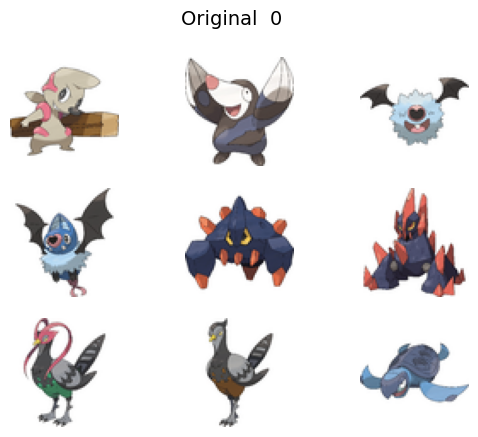

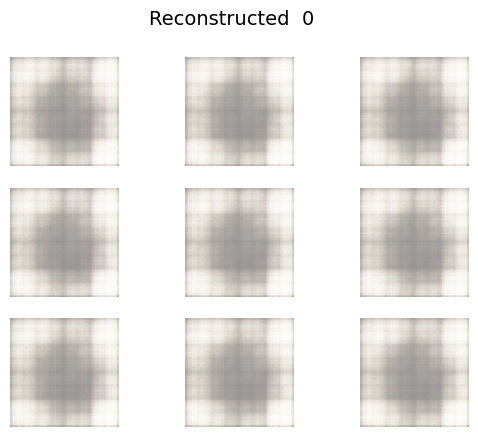

In [ ]:
def build_convolutional_autoencoder(data_shape, latent_dim, filters=128):
    encoder = build_conv_net(in_shape=data_shape, out_shape=latent_dim, filters=filters)
    decoder = build_deconv_net(latent_dim, activation_out='sigmoid', filters=filters)

    # We connect encoder and decoder into a single model
    autoencoder = tf.keras.Sequential([encoder, decoder])

    # Binary crossentropy loss - pairwise comparison between input and output pixels
    autoencoder.compile(loss='binary_crossentropy', optimizer='adam')

    return autoencoder


# Defining the model dimensions and building it
image_size = dataset.shape[1:]
latent_dim = 512
num_filters = 128
cae = build_convolutional_autoencoder(image_size, latent_dim, num_filters)

for epoch in range(50):
    print('\nEpoch: ', epoch)

    # Note that (X=y) when training autoencoders!
    # In this case we only care about qualitative performance, we don't split into train/test sets
    cae.fit(x=dataset, y=dataset, epochs=1, batch_size=64)

    samples = dataset[:9]
    reconstructed = cae.predict(samples)
    grid_plot(samples, epoch, name='Original', n=3, save=False)
    grid_plot(reconstructed, epoch, name='Reconstructed', n=3, save=False)

*Note: You may experiment with the latent dimensionality and number of filters in your convolutional network to see how it affects the reconstruction quality. Remember that this also affects the size of the model and time it takes to train.*

---
---


## 2. 2. Variational Autoencoders (VAEs)

<img src="https://lilianweng.github.io/lil-log/assets/images/vae-gaussian.png" width="500">

#### Encoder network
This defines the approximate posterior distribution, which takes as input an observation and outputs a set of parameters for specifying the conditional distribution of the latent representation. In this example, we simply model the distribution as a diagonal Gaussian, and the network outputs the mean and log-variance parameters of a factorized Gaussian. We output log-variance instead of the variance directly for numerical stability.

#### Decoder network
This defines the conditional distribution of the observation $z$, which takes a latent sample $z$ as input and outputs the parameters for a conditional distribution of the observation. We model the latent distribution prior  as a unit Gaussian.

#### Reparameterization trick
To generate a sample  for the decoder during training, we can sample from the latent distribution defined by the parameters outputted by the encoder, given an input observation $z$. However, this sampling operation creates a bottleneck because backpropagation cannot flow through a random node.

To address this, we use a reparameterization trick. In our example, we approximate  using the decoder parameters and another parameter  as follows:

$$z = \mu + \sigma\epsilon$$

where $\mu$ and $\sigma$  represent the mean and standard deviation of a Gaussian distribution respectively. They can be derived from the decoder output. The  can be thought of as a random noise used to maintain stochasticity of $z$. We generate  from a standard normal distribution.

The latent variable  is now generated by a function of $\mu$ and $\sigma$ which would enable the model to backpropagate gradients in the encoder through $\mu$ and $\sigma$ respectively, while maintaining stochasticity through $\epsilon$.

#### Implementation

You can see how this trick is implemented below by creating a custom layer by sublassing tf.keras.layers.Layer.
It is then connected to the output of the original encoder architecture and an additional [KL](https://en.wikipedia.org/wiki/Kullback–Leibler_divergence) loss term is introduced.


In [ ]:
class Sampling(tf.keras.layers.Layer):
    """
    Custom layer for the variational autoencoder
    It takes two vectors as input - one for means and other for variances of the latent variables described by a multimodal gaussian
    Its output is a latent vector randomly sampled from this distribution
    """
    def call(self, inputs):
        z_mean, z_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_var) * epsilon

def build_vae(data_shape, latent_dim, filters=128):

    # Building the encoder - starts with a simple downsampling convolutional network
    encoder = build_conv_net(data_shape, latent_dim*2, filters=filters)

    # Adding special sampling layer that uses the reparametrization trick
    z_mean = Dense(latent_dim)(encoder.output)
    z_var = Dense(latent_dim)(encoder.output)
    z = Sampling()([z_mean, z_var])

    # Connecting the two encoder parts
    encoder = tf.keras.Model(inputs=encoder.input, outputs=z)

    # Defining the decoder which is a regular upsampling deconvolutional network
    decoder = build_deconv_net(latent_dim, activation_out='sigmoid', filters=filters)
    vae = tf.keras.Model(inputs=encoder.input, outputs=decoder(z))

    # Adding the special loss term
    kl_loss = -0.5 * tf.reduce_sum(z_var - tf.square(z_mean) - tf.exp(z_var) + 1)
    vae.add_loss(kl_loss/tf.cast(tf.keras.backend.prod(data_shape), tf.float32))

    vae.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3), loss='binary_crossentropy')

    return encoder, decoder, vae


Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 32, 32, 128)       3584      
                                                                 
 conv2d_7 (Conv2D)           (None, 16, 16, 128)       147584    
                                                                 
 conv2d_8 (Conv2D)           (None, 8, 8, 128)         147584    
                                                                 
 conv2d_9 (Conv2D)           (None, 4, 4, 128)         147584    
                                                                 
 conv2d_10 (Conv2D)          (None, 2, 2, 128)         147584    
                                                                 
 flatten_1 (Flatten)         (None, 512)               0         
                                                                 
 dense_2 (Dense)             (None, 64)               

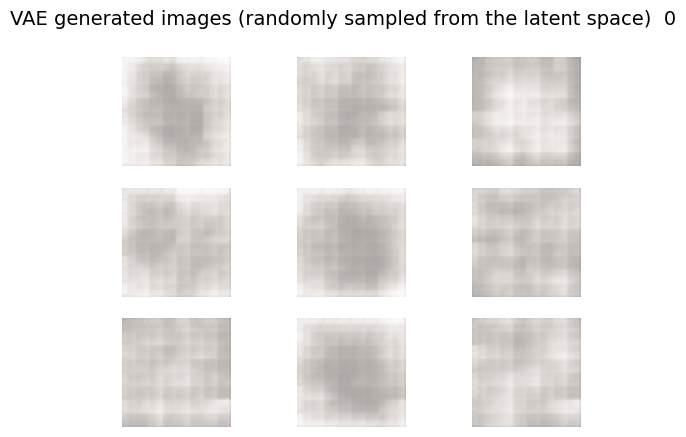

In [ ]:
# Training the VAE model

latent_dim = 32
encoder, decoder, vae = build_vae(dataset.shape[1:], latent_dim, filters=128)

# Generate random vectors that we will use to sample our latent space
for epoch in range(20):
    latent_vectors = np.random.randn(9, latent_dim)
    vae.fit(x=dataset, y=dataset, epochs=1, batch_size=8)

    images = decoder(latent_vectors)
    grid_plot(images, epoch, name='VAE generated images (randomly sampled from the latent space)', n=3, save=False)

*Note: again, you might experiment with the latent dimensionality, batch size and the architecture of your convolutional nets to see how it affects the generative capabilities of this model.*

---

## 2.3 Generative Adversarial Networks (GANs)

### GAN architecture
Generative adversarial networks consist of two models: a generative model and a discriminative model.

<img src="https://media.springernature.com/original/springer-static/image/chp%3A10.1007%2F978-1-4842-3679-6_8/MediaObjects/463582_1_En_8_Fig1_HTML.jpg" width="500">

**The discriminator** model is a classifier that determines whether a given image looks like a real image from the dataset or like an artificially created image. This is basically a binary classifier that will take the form of a normal convolutional neural network (CNN).
As an input this network will get samples both from the dataset that it is trained on and on the samples generated by the **generator**.

The **generator** model takes random input values (noise) and transforms them into images through a deconvolutional neural network.

Over the course of many training iterations, the weights and biases in the discriminator and the generator are trained through backpropagation. The discriminator learns to tell "real" images of handwritten digits apart from "fake" images created by the generator. At the same time, the generator uses feedback from the discriminator to learn how to produce convincing images that the discriminator can't distinguish from real images.




In [ ]:
from tensorflow.keras.optimizers.legacy import Adam

def build_gan(data_shape, latent_dim, filters=128, lr=0.0002, beta_1=0.5):
    optimizer = Adam(learning_rate=lr, beta_1=beta_1)

    # Usually thew GAN generator has tanh activation function in the output layer
    generator = build_deconv_net(latent_dim, activation_out='tanh', filters=filters)

    # Build and compile the discriminator
    discriminator = build_conv_net(in_shape=data_shape, out_shape=1, filters=filters) # Single output for binary classification
    discriminator.compile(loss='binary_crossentropy', optimizer=optimizer)

    # End-to-end GAN model for training the generator
    discriminator.trainable = False
    true_fake_prediction = discriminator(generator.output)
    GAN = tf.keras.Model(inputs=generator.input, outputs=true_fake_prediction)
    GAN = tf.keras.models.Sequential([generator, discriminator])
    GAN.compile(loss='binary_crossentropy', optimizer=optimizer)

    return discriminator, generator, GAN


### Definining custom functions for training your GANs

---




*Note: the samples generated by small GANs are more diverse, when compared to VAEs, however some samples might look strange and do not resemble the data the model was trained on.

In [ ]:
# Your code

In [24]:
latent_dim = 256

def run_generator(generator, n_samples=100):
    """
    Run the generator model and generate n samples of synthetic images using random latent vectors
    """
    latent_dim = generator.layers[0].input_shape[-1]
    generator_input = np.random.randn(n_samples, latent_dim)

    return generator.predict(generator_input)


def get_batch(generator, dataset, batch_size=128):
    """
    Gets a single batch of samples (X) and labels (y) for the training the discriminator.
    One half from the real dataset (labeled as 1s), the other created by the generator model (labeled as 0s).
    """
    batch_size //= 2 # Split evenly among fake and real samples

    fake_data = run_generator(generator, n_samples=batch_size)
    real_data = dataset[np.random.randint(0, dataset.shape[0], batch_size)]

    X = np.concatenate([fake_data, real_data], axis=0)

    # Apply label smoothing to stabilize GAN training
    y_fake = np.zeros([batch_size, 1]) + 0.1  # smooth fake labels to 0.1
    y_real = np.ones([batch_size, 1]) - 0.1   # smooth real labels to 0.9
    y = np.concatenate([y_fake, y_real], axis=0)

    return X, y


import os
import sys

import matplotlib.pyplot as plt

def train_gan(generator, discriminator, gan, dataset, latent_dim, n_epochs=20, batch_size=128, gen_updates=3):
    batches_per_epoch = int(dataset.shape[0] / batch_size / 2)

    d_real_losses_epoch, d_fake_losses_epoch, gen_losses_epoch = [], [], []
    acc_real_epoch, acc_fake_epoch = [], []

    orig_stdout = sys.stdout

    for epoch in range(n_epochs):
        d_real_loss_sum, d_fake_loss_sum, gen_loss_sum = 0, 0, 0
        acc_real_sum, acc_fake_sum = 0, 0

        for batch in range(batches_per_epoch):
            sys.stdout = open(os.devnull, 'w')

            # Train discriminator on real and fake images
            X, y = get_batch(generator, dataset, batch_size=batch_size)
            half_batch = batch_size // 2
            d_real_loss = discriminator.train_on_batch(X[half_batch:], y[half_batch:])
            d_fake_loss = discriminator.train_on_batch(X[:half_batch], y[:half_batch])

            d_real_loss_sum += d_real_loss[0]
            acc_real_sum += d_real_loss[1]
            d_fake_loss_sum += d_fake_loss[0]
            acc_fake_sum += d_fake_loss[1]

            # 2) Train generator multiple times per discriminator update
            for _ in range(gen_updates):
                X_gan = np.random.randn(batch_size, latent_dim)
                y_gan = np.ones([batch_size, 1])
                generator_loss = gan.train_on_batch(X_gan, y_gan)
                gen_loss_sum += generator_loss[0]

            sys.stdout = orig_stdout

        d_real_losses_epoch.append(d_real_loss_sum / batches_per_epoch)
        acc_real_epoch.append(acc_real_sum / batches_per_epoch)
        d_fake_losses_epoch.append(d_fake_loss_sum / batches_per_epoch)
        acc_fake_epoch.append(acc_fake_sum / batches_per_epoch)
        gen_losses_epoch.append(gen_loss_sum / gen_updates / batches_per_epoch)

        if epoch % 10 == 0:
            noise = np.random.randn(16, latent_dim)
            images = generator.predict(noise)
            grid_plot(images, epoch, name='GAN generated images', n=3, save=False, scale=True)

    # Plotting the learning curves after training
    plt.figure(figsize=(12, 6))

    # Top subplot: Losses
    plt.subplot(2, 1, 1)
    plt.plot(d_real_losses_epoch, label="d-real", color='blue')
    plt.plot(d_fake_losses_epoch, label="d-fake", color='orange')
    plt.plot(gen_losses_epoch, label="gen", color='green')
    plt.title("Line Plots of Loss")
    plt.legend()

    # Bottom subplot: Accuracies
    plt.subplot(2, 1, 2)
    plt.plot(acc_real_epoch, label="acc-real", color='blue')
    plt.plot(acc_fake_epoch, label="acc-fake", color='orange')
    plt.title("Line Plots of Accuracy")
    plt.xlabel("Epochs")
    plt.legend()

    plt.tight_layout()
    plt.show()




In [25]:
from tensorflow.keras.layers import Dense, Flatten, Conv2D, Conv2DTranspose, Reshape, BatchNormalization, Activation, Dropout, UpSampling2D, LeakyReLU

# Discriminator
def build_conv_net(in_shape, out_shape, filters=64, out_activation='sigmoid'):
    """
    Build a basic convolutional network
    """
    model = tf.keras.Sequential()

    # Initial Conv layer
    model.add(tf.keras.layers.Conv2D(filters, (5, 5), strides=2, input_shape=in_shape, padding='same'))
    model.add(tf.keras.layers.LeakyReLU(alpha=0.2))

    # Add more layers with increased filters
    for n_filters in [128, 256, 512]:
        model.add(tf.keras.layers.Conv2D(n_filters, (5, 5), strides=2, padding='same'))
        model.add(tf.keras.layers.LeakyReLU(alpha=0.2))
        model.add(tf.keras.layers.Dropout(0.4))

    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(out_shape, activation=out_activation))
    model.summary()

    return model

#Generator
def build_deconv_net(latent_dim, n_upsampling_layers=4, filters=128, activation_out='tanh'):
    """
    Build a deconvolutional network for decoding/upscaling latent vectors

    When building the deconvolutional architecture, usually it is best to use the same layer sizes that
    were used in the downsampling network and the Conv2DTranspose layers are used instead of Conv2D layers.
    Using identical layers and hyperparameters ensures that the dimensionality of our output matches the
    shape of our input images.
    """

    model = tf.keras.Sequential()
  # Beginning layers starting from a 4x4 spatial dimension
    model.add(Dense(4*4*256, input_dim=latent_dim))  # Adjusted dense layer size
    model.add(BatchNormalization(momentum=0.9))
    model.add(Activation('relu'))
    model.add(Reshape((4,4,256)))
    model.add(Dropout(0.4))

    # Upsampling layers with the provided structure
    for _ in range(n_upsampling_layers):
        model.add(UpSampling2D())
        model.add(Conv2D(filters=filters, kernel_size=5, padding='same'))
        model.add(BatchNormalization(momentum=0.9))
        model.add(Activation('relu'))

        # Halve the number of filters for the next layer
        filters //= 2
        if filters < 32:  # Make sure it doesn't go below a certain threshold
            filters = 32

    # End layers from build_generator
    model.add(Conv2D(32, 5, padding='same'))
    model.add(BatchNormalization(momentum=0.9))
    model.add(Activation('relu'))

    model.add(Conv2D(3, 5, padding='same'))
    model.add(Activation(activation_out))
    model.summary()
    return model

In [26]:
from tensorflow.keras.optimizers import Adam, RMSprop

def build_gan(discriminator, generator):
    """
    Build a GAN by combining the discriminator and generator models.
    """
    discriminator.trainable = False  # Freeze the discriminator

    model = tf.keras.Sequential()
    model.add(generator)
    model.add(discriminator)

    return model

# Define optimizers
discriminator_optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=0.0002, clipvalue=1.0, decay=6e-8)
adversarial_optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=0.00001, clipvalue=1.0, decay=3e-8)

# Build the discriminator
discriminator = build_conv_net(in_shape=dataset.shape[1:], out_shape=1)
discriminator.compile(loss='binary_crossentropy',
                      optimizer=discriminator_optimizer,
                      metrics=['accuracy'])

# Build the generator
generator = build_deconv_net(latent_dim=latent_dim)

# Build the combined GAN model
gan = build_gan(discriminator, generator)
gan.compile(loss='binary_crossentropy',
            optimizer=adversarial_optimizer,
            metrics=['accuracy'])


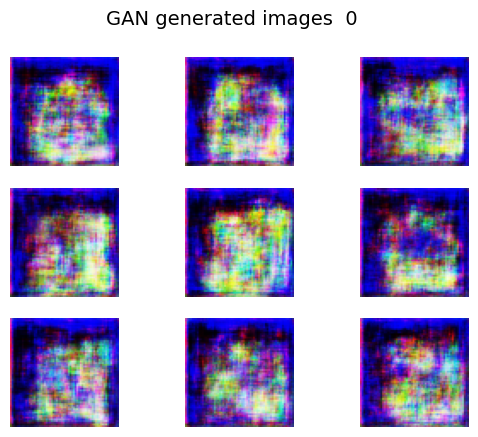

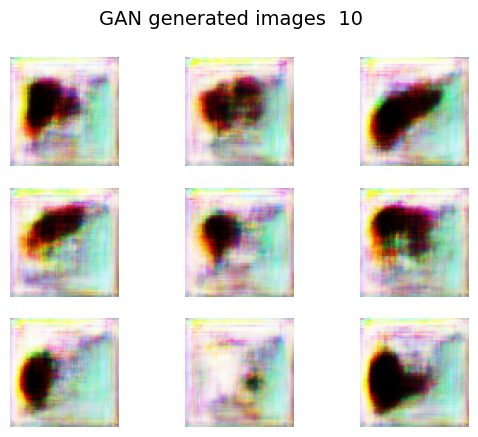

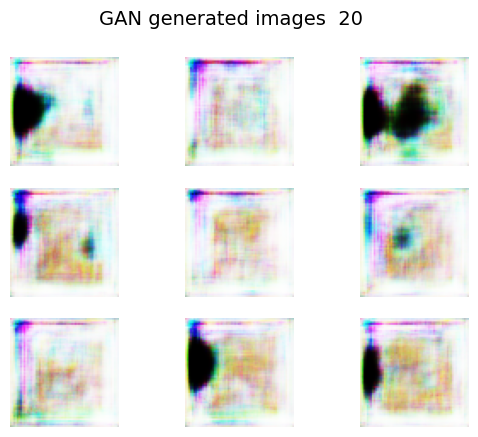

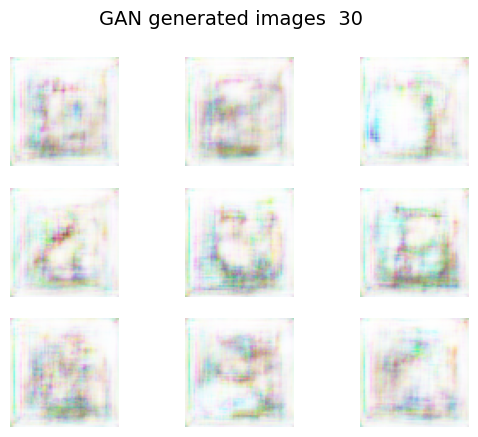

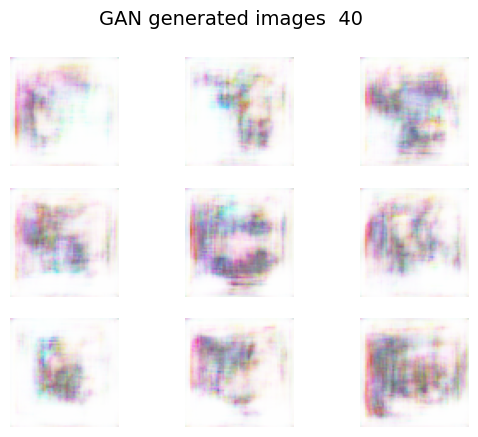

...

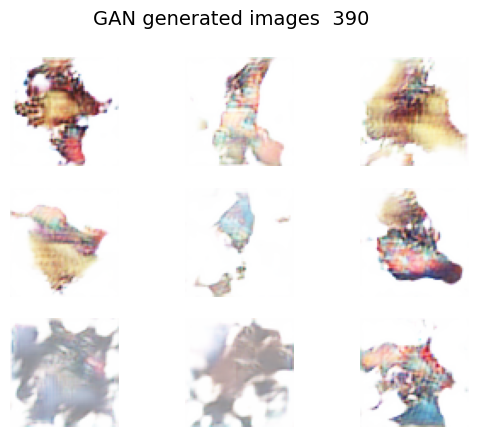

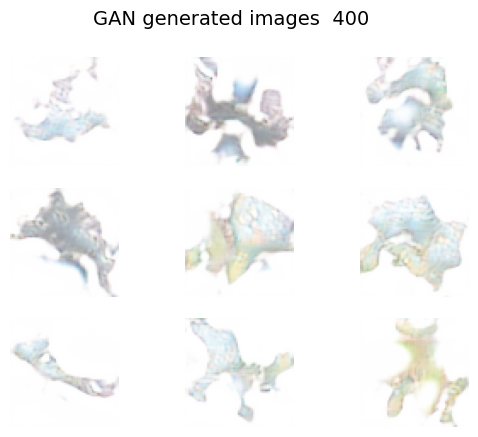

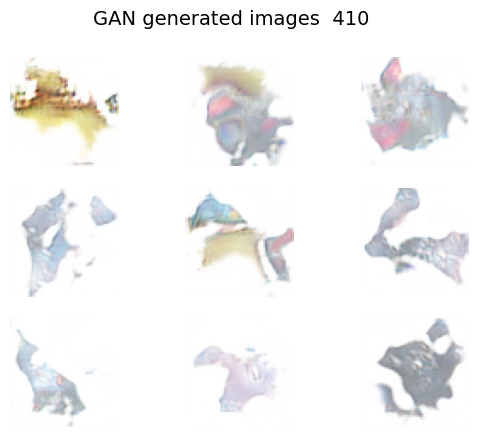

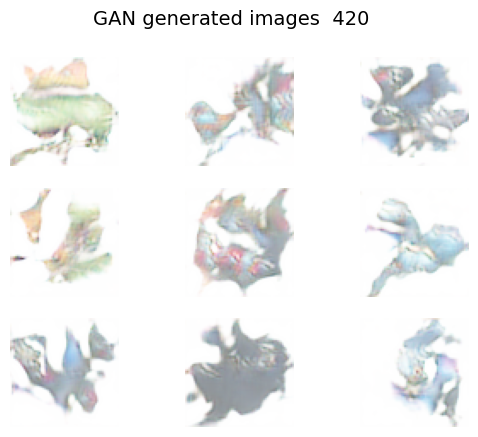

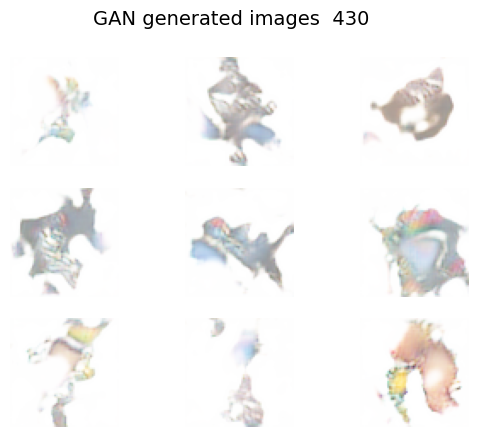

In [ ]:
## Build and train the model (gen_updates =3 and gen lr = 0.00001) Seems to give moer diverse images. But will it learn enough to be high quality images?

latent_dim = 256
dataset_scaled = load_real_samples(scale=True)
combined_dataset = np.concatenate([dataset_scaled, augmented_data], axis=0)


train_gan(generator, discriminator, gan, combined_dataset, latent_dim, n_epochs=1001)

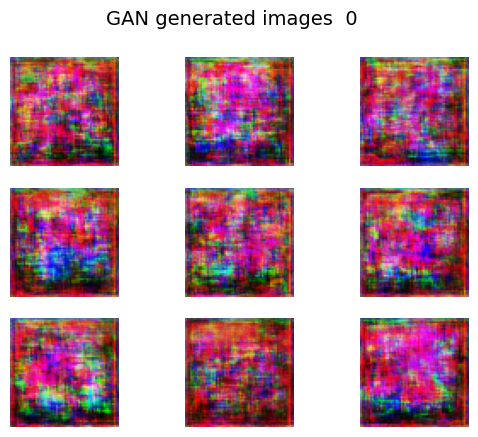

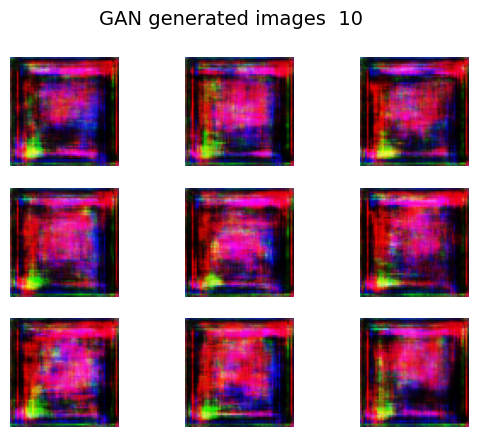

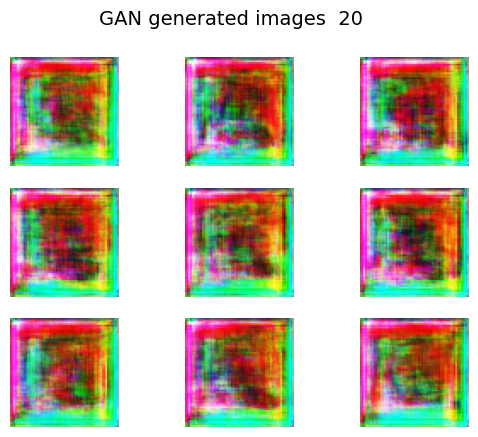

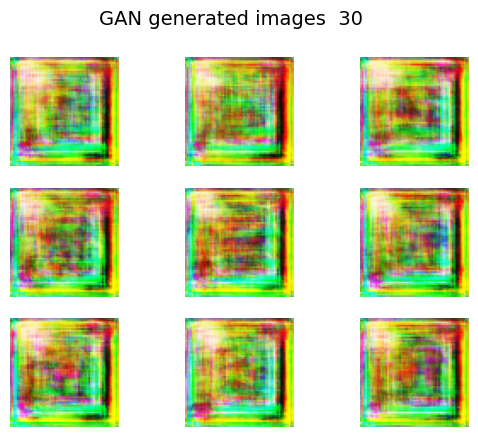

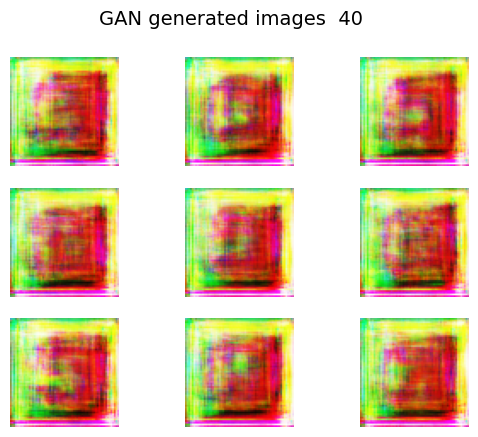

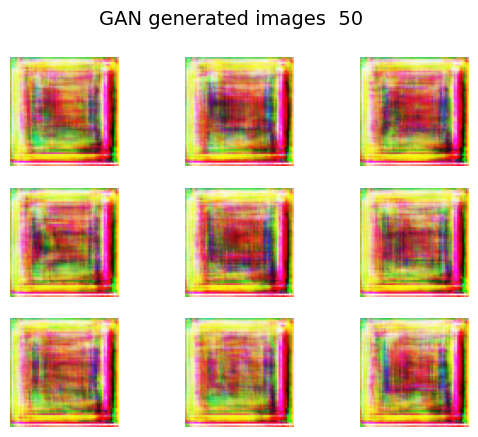

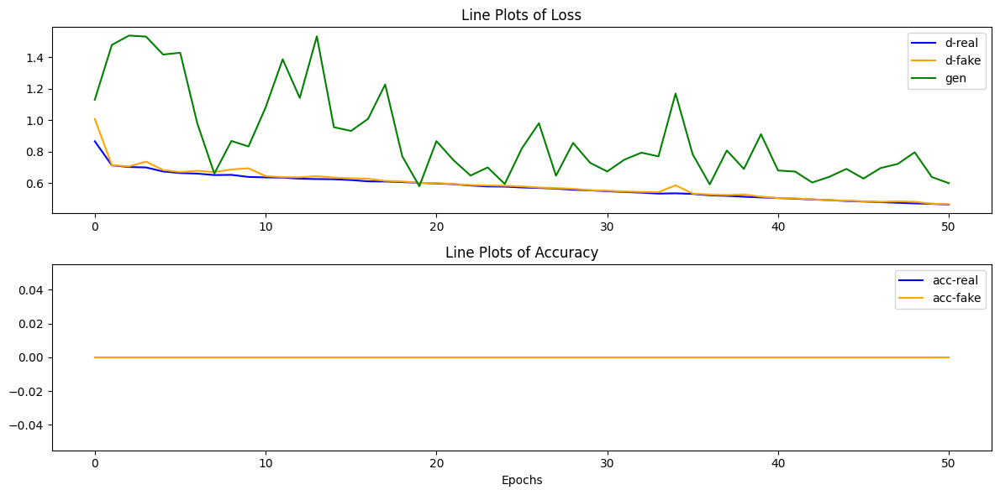

In [23]:
## Build and train the model (gen_updates =3 and gen lr = 0.00001) Added batch normalization and regularization to discriminator as it is too overpowering.
latent_dim = 256
dataset_scaled = load_real_samples(scale=True)
combined_dataset = np.concatenate([dataset_scaled, augmented_data], axis=0)


train_gan(generator, discriminator, gan, combined_dataset, latent_dim, n_epochs=51)

In [16]:
## Build and train the model (gen_updates =3 and gen lr = 0.00001) Added batch normalization and regularization to discriminator as it is too overpowering.
latent_dim = 256
dataset_scaled = load_real_samples(scale=True)
combined_dataset = np.concatenate([dataset_scaled, augmented_data], axis=0)


train_gan(generator, discriminator, gan, combined_dataset, latent_dim, n_epochs=251)

Output hidden; open in https://colab.research.google.com to view.

In [8]:
## Build and train the model (gen_updates =3 and gen lr = 0.00001) Seems to give moer diverse images. But will it learn enough to be high quality images?

latent_dim = 256
dataset_scaled = load_real_samples(scale=True)
combined_dataset = np.concatenate([dataset_scaled, augmented_data], axis=0)


train_gan(generator, discriminator, gan, combined_dataset, latent_dim, n_epochs=301)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
## Build and train the model (less complex model again, generator lr = 0.0001, gen_update = 4)

latent_dim = 256
dataset_scaled = load_real_samples(scale=True)
combined_dataset = np.concatenate([dataset_scaled, augmented_data], axis=0)


train_gan(generator, discriminator, gan, combined_dataset, latent_dim, n_epochs=1001)

In [ ]:

generator.save_weights("/content/drive/My Drive/Colab Notebooks/best_model_1001epochs_gen_weights.h5")
discriminator.save_weights("/content/drive/My Drive/Colab Notebooks/best_model_1001epochs_disc_weights.h5")
gan.save_weights("/content/drive/My Drive/Colab Notebooks/best_model_1001epochs_gan_weights.h5")

# Above results were the best until now. We are getting consistent Pokemon shapes, we just lack detail and color. More epochs might fix this. Loss curves also look healthy.
The plot you provided shows the losses for the discriminator on real images (d-real), the discriminator on fake images (d-fake), and the generator (gen). Analyzing these plots can give insights into the training dynamics of your GAN. Here's what I observe and infer:

Loss Stabilization: After an initial period of volatility (particularly visible around the first 200 epochs), the losses seem to stabilize somewhat. This could indicate that the GAN is finding some equilibrium, which is typically what we hope for during GAN training.

Discriminator Performance: The d-real and d-fake losses are both relatively low and close to each other, especially in the latter half of training. This suggests that the discriminator is doing a fairly good job at distinguishing real from fake images, but it's not perfectly confident (losses aren't approaching 0).

Generator Performance: The generator loss (gen) oscillates but doesn't show a strong increasing or decreasing trend in the latter epochs. This suggests that the generator is improving (as it's not letting the discriminator "win" entirely) but might still have room for further improvement.

Oscillations: The oscillatory nature of the generator loss indicates that there's still a bit of a "tug of war" going on between the generator and the discriminator. This is typical of GANs but can sometimes be reduced with tweaks to learning rates or model architectures.

Given these observations, here are some conclusions:

Potential for Further Training: Given that the losses have stabilized but haven't converged to a very low value (especially the generator's loss), there might be room for improvement with additional epochs. However, the improvements might be incremental, and there's no guarantee that the image quality will drastically improve.

Watch for Mode Collapse: If you decide to continue training, keep an eye out for mode collapse, where the generator starts producing the same or very similar images repeatedly. If the d-fake loss starts to significantly deviate from the d-real loss, it could be an indication of this issue.

Hyperparameter Tuning: Before further training, consider revisiting hyperparameters, especially the learning rates. If the learning rates are too high, the oscillations might continue; if too low, the model might not improve significantly.

Regular Evaluations: Consider saving generated images at regular intervals and evaluating their quality visually. Sometimes the loss values might not fully reflect the visual improvements in generated images.

In conclusion, while there is potential for further improvement with more epochs, I'd recommend doing so with caution. Regularly evaluate the visual quality of the generated images and monitor the loss plots to ensure productive training.

1/1 [==============================] - 0s 19ms/step


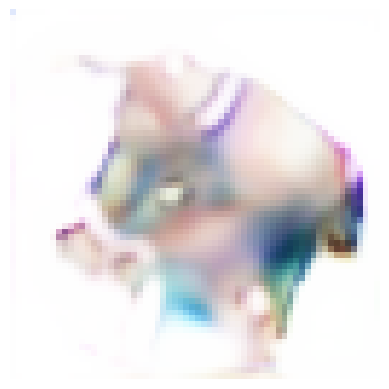

In [ ]:
# Assuming generator is your trained generator model

def generate_new_image(generator, latent_dim):
    # Generate random noise as an input for the generator
    random_noise = np.random.randn(1, latent_dim)

    # Generate an image from the random noise
    generated_image = generator.predict(random_noise)

    # Rescale the pixel values from [-1, 1] to [0, 1]
    generated_image = (generated_image + 1) / 2.0

    return generated_image

# Generate a new image
gen_image = generate_new_image(generator, latent_dim)

# Display the generated image
plt.imshow(gen_image[0])
plt.axis('off')
plt.show()

### We can generate a new image from the model

2/2 [==============================] - 0s 347ms/step


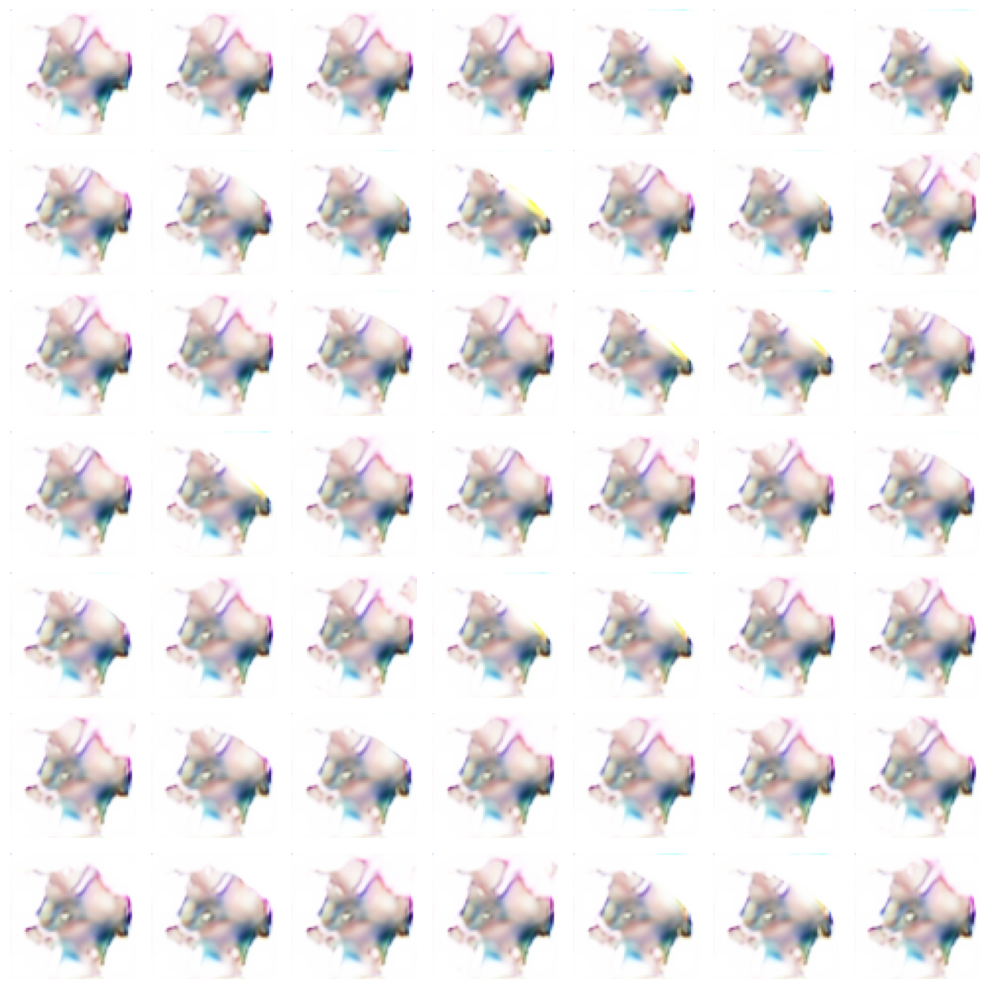

In [ ]:
def generate_batch_images(generator, latent_dim, n_samples=49):
    # Generate random noise as an input for the generator
    random_noise = np.random.randn(n_samples, latent_dim)

    # Generate images from the random noise
    generated_images = generator.predict(random_noise)

    # Rescale the pixel values from [-1, 1] to [0, 1]
    generated_images = (generated_images + 1) / 2.0

    return generated_images

def plot_images_in_grid(images, rows, cols):
    # Create a figure with specified rows and columns
    fig, axes = plt.subplots(rows, cols, figsize=(10,10))

    for i in range(rows):
        for j in range(cols):
            # Extract the corresponding image
            img = images[i*cols + j]

            # Display the image on the corresponding axes
            axes[i, j].imshow(img)
            axes[i, j].axis('off')

    plt.tight_layout()
    plt.show()

# Generate a batch of images
gen_batch_images = generate_batch_images(generator, latent_dim, 49)

# Plot the images in a 6x6 grid
plot_images_in_grid(gen_batch_images, 7, 7)


### When we generate 49 images we clearly notice that all look similar. This suggests that we are still suffering from mode collapse.

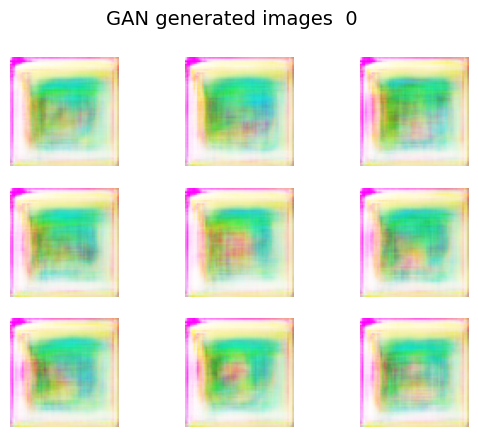

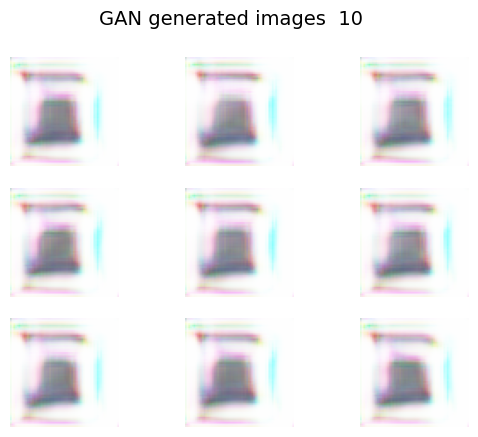

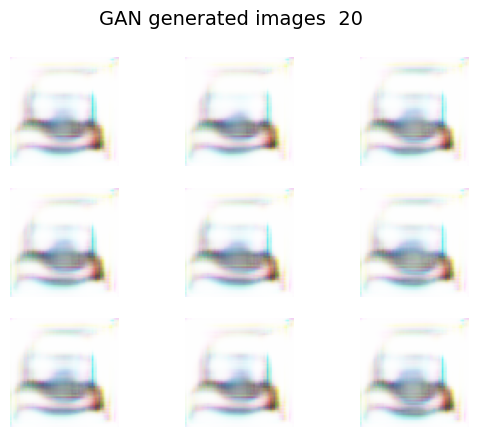

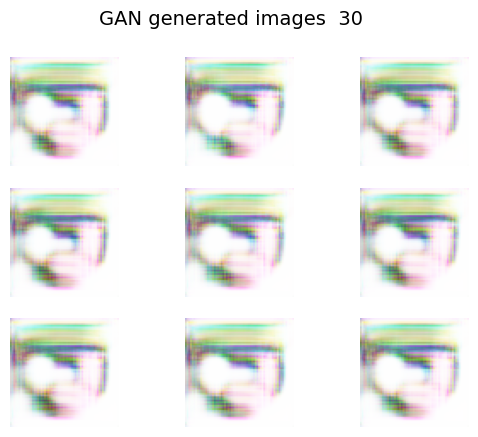

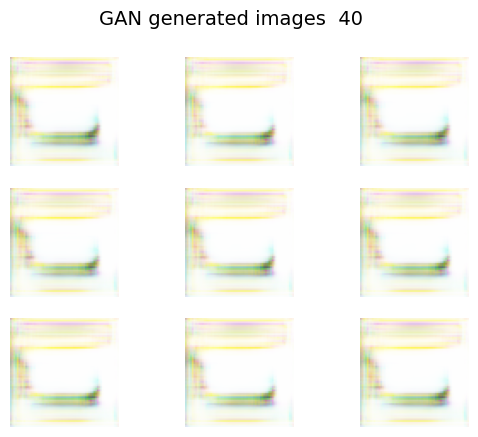

...

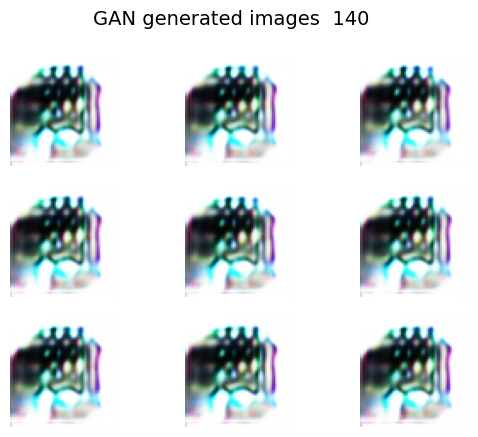

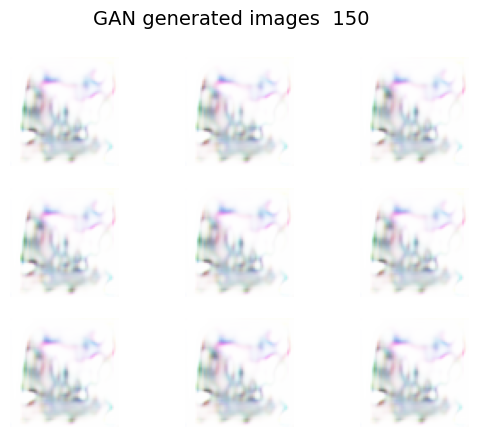

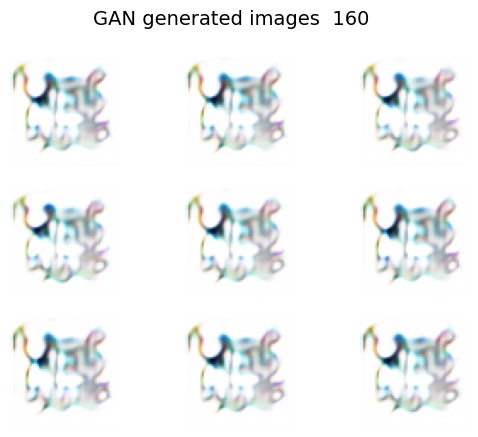

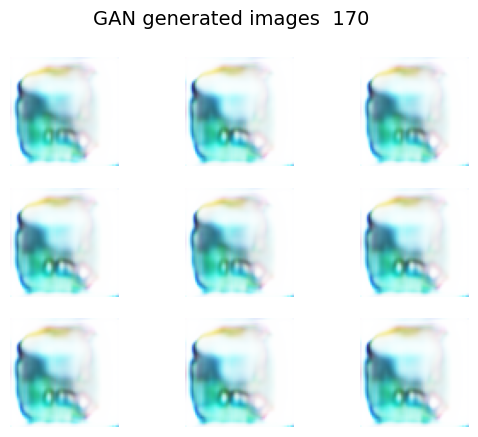

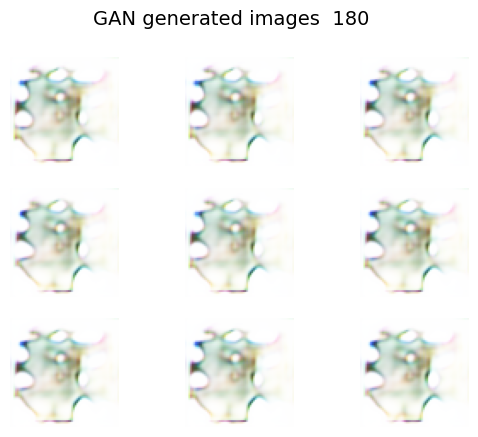

In [ ]:
## Build and train the model (more complex model)

latent_dim = 256
dataset_scaled = load_real_samples(scale=True)
combined_dataset = np.concatenate([dataset_scaled, augmented_data], axis=0)


train_gan(generator, discriminator, gan, combined_dataset, latent_dim, n_epochs=1001)

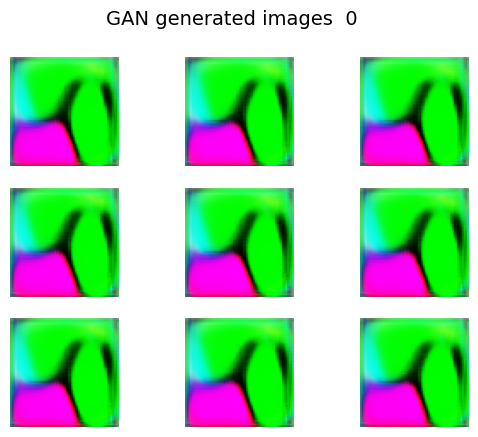

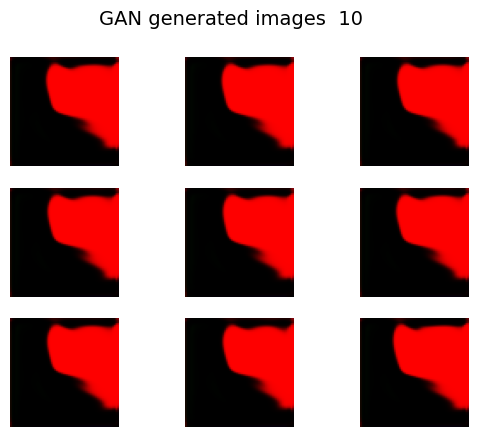

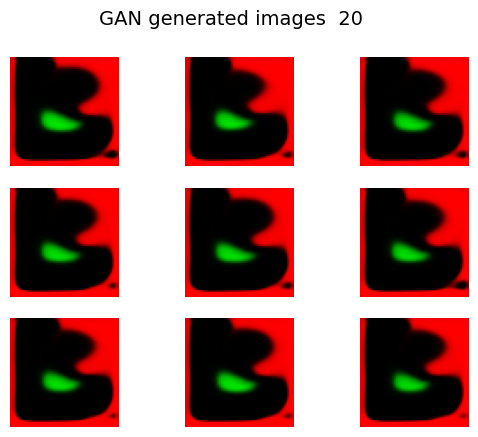

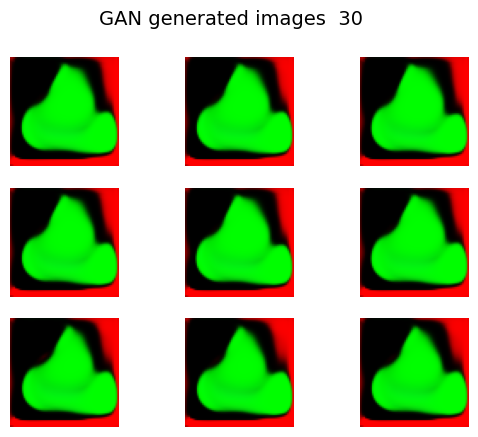

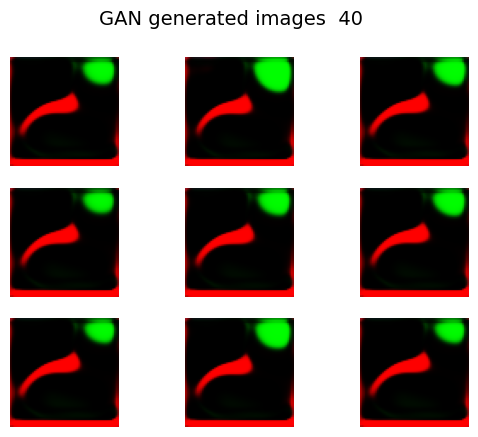

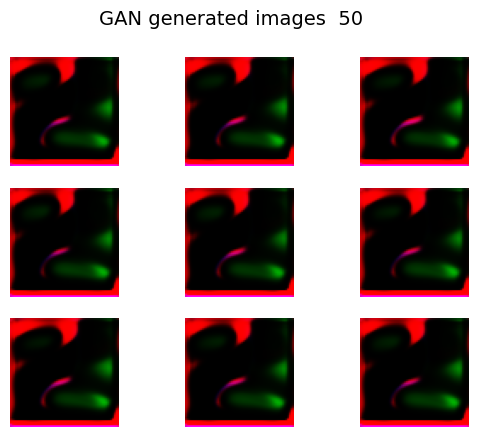

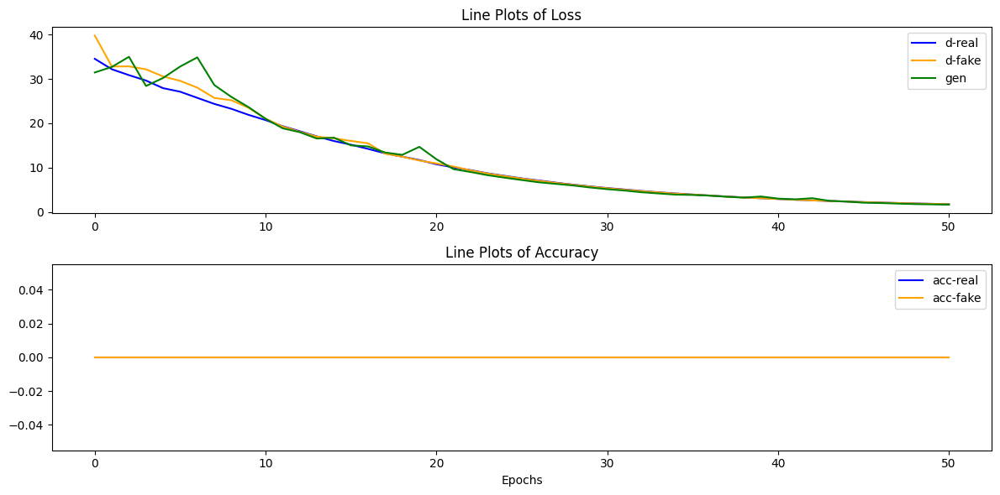

In [ ]:
## Build and train the model (more complex model)

latent_dim = 256
dataset_scaled = load_real_samples(scale=True)
combined_dataset = np.concatenate([dataset_scaled, augmented_data], axis=0)


train_gan(generator, discriminator, gan, combined_dataset, latent_dim, n_epochs=51)

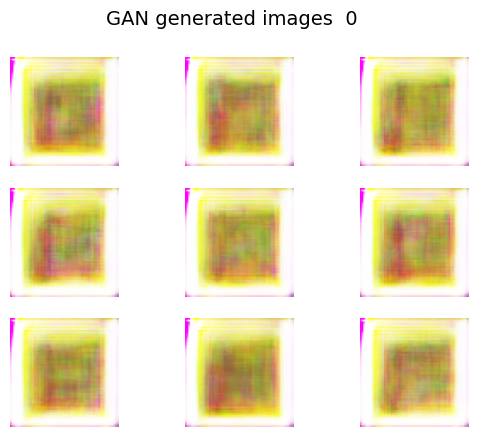

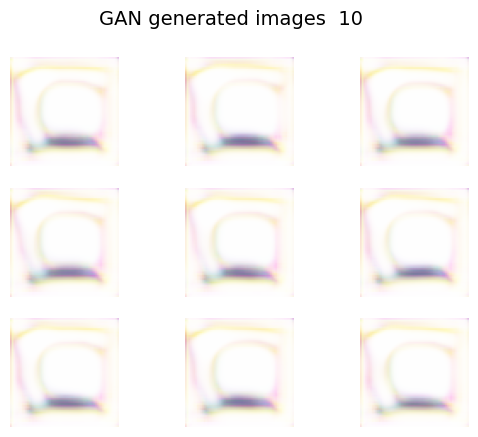

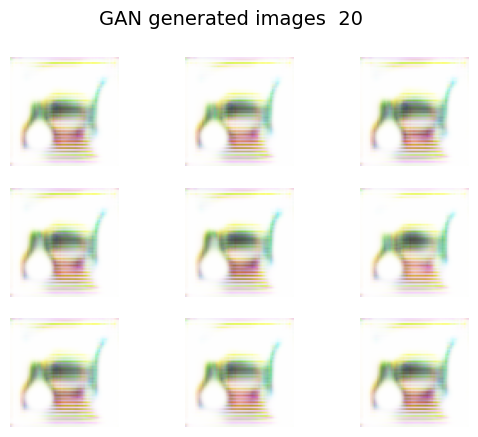

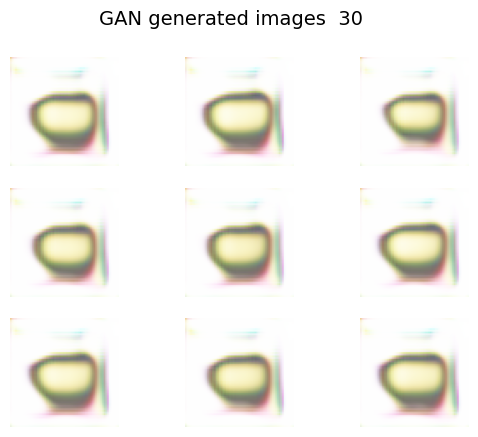

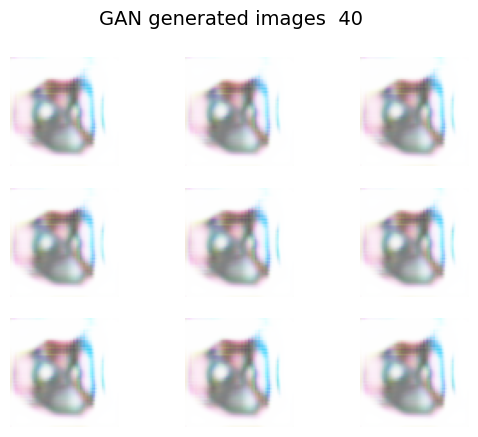

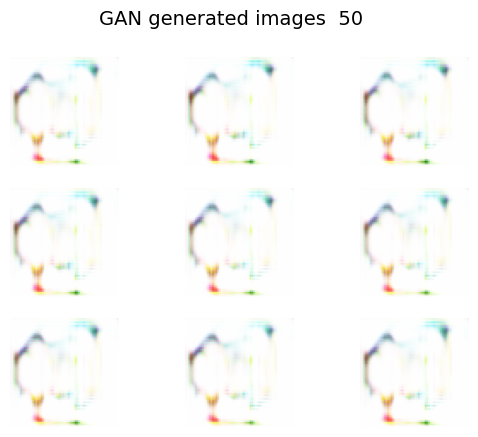

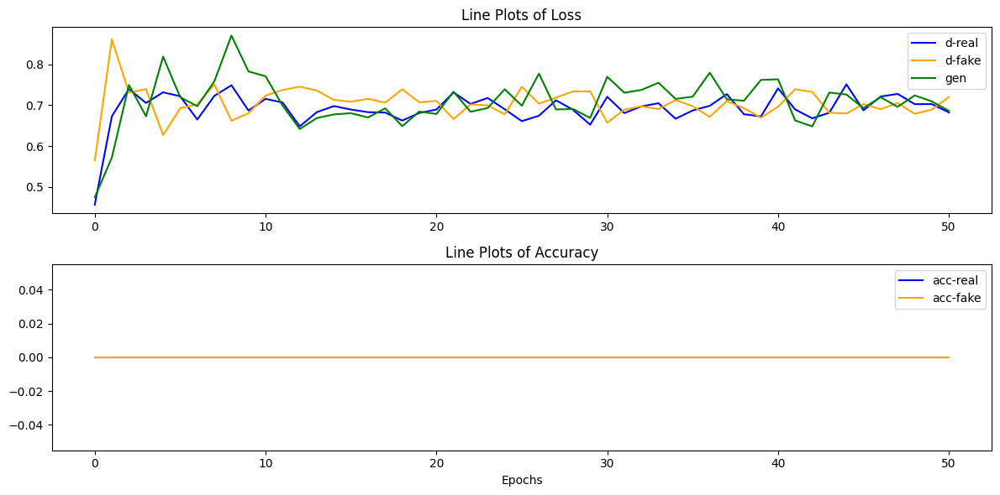

In [ ]:
## Build and train the model (gen_updats =4  )

latent_dim = 256
dataset_scaled = load_real_samples(scale=True)
combined_dataset = np.concatenate([dataset_scaled, augmented_data], axis=0)


train_gan(generator, discriminator, gan, combined_dataset, latent_dim, n_epochs=51)

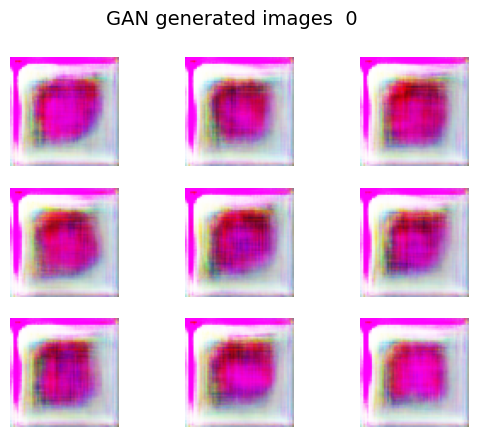

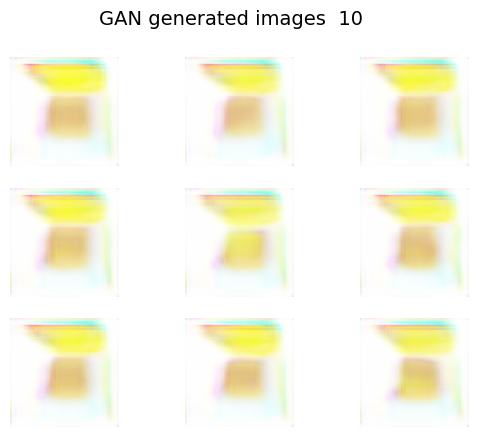

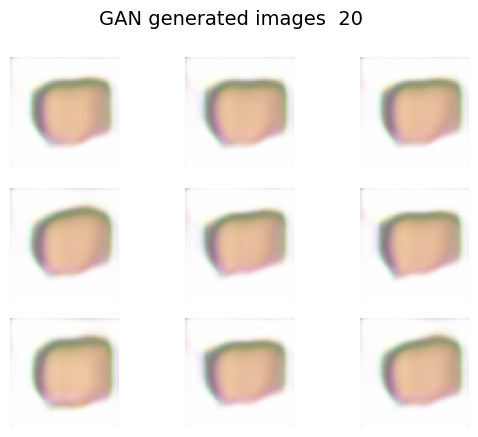

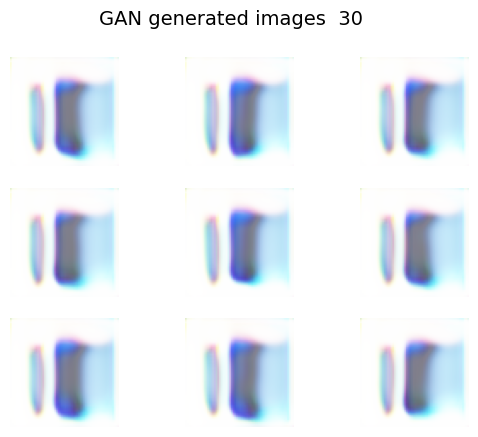

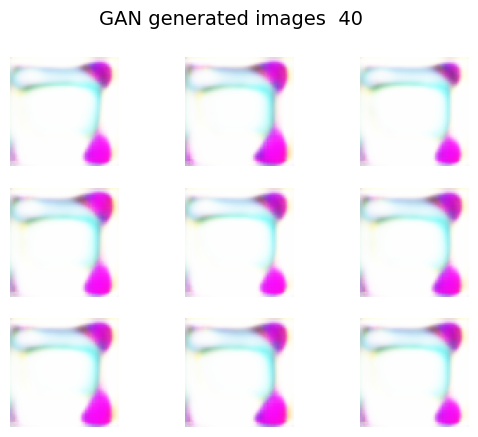

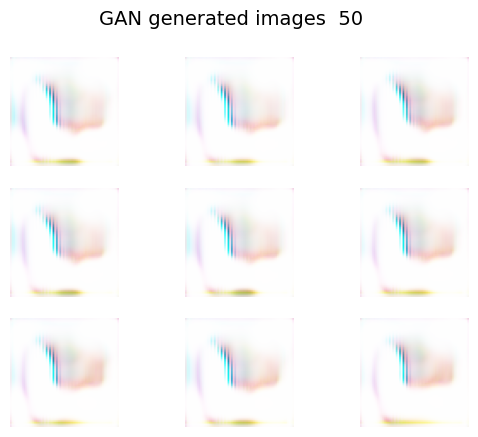

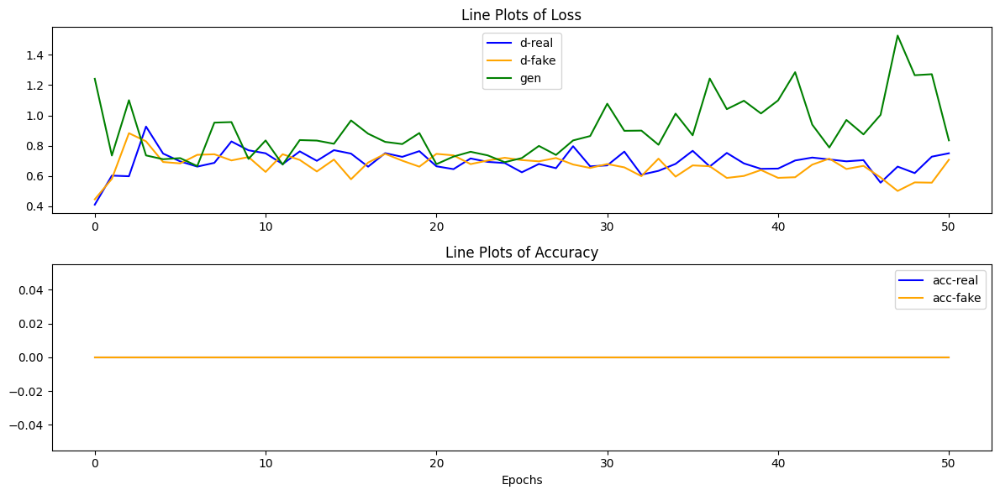

In [ ]:
## Build and train the model (Adam for discriminator and generator optimizer)

latent_dim = 256
dataset_scaled = load_real_samples(scale=True)
combined_dataset = np.concatenate([dataset_scaled, augmented_data], axis=0)


train_gan(generator, discriminator, gan, combined_dataset, latent_dim, n_epochs=51)

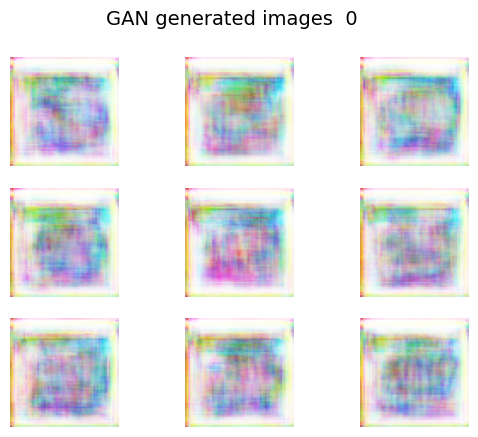

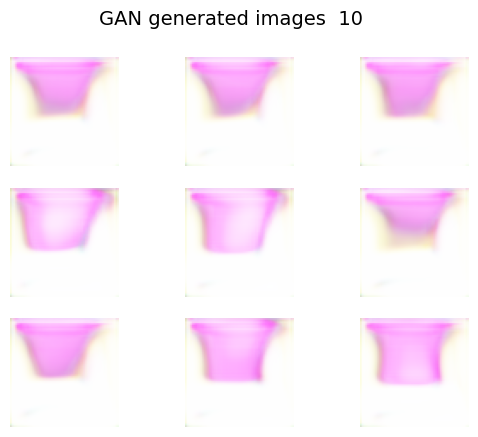

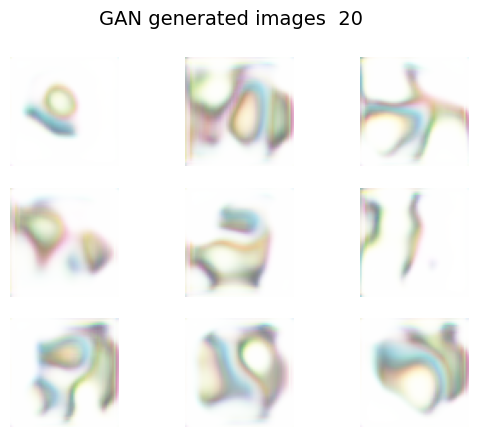

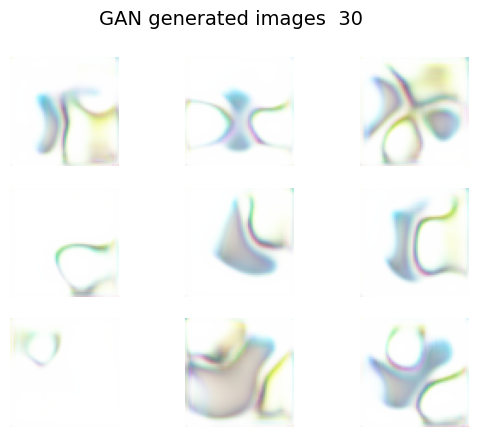

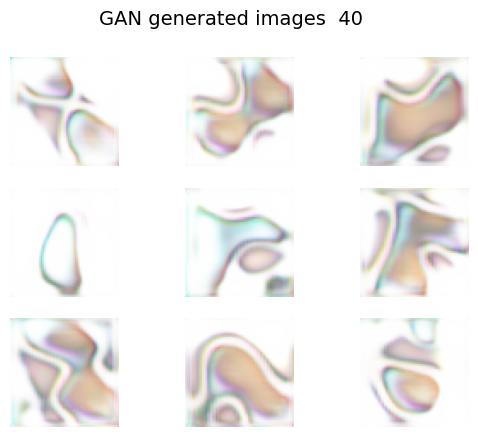

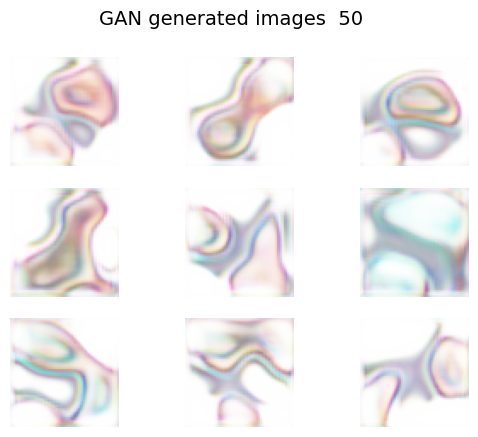

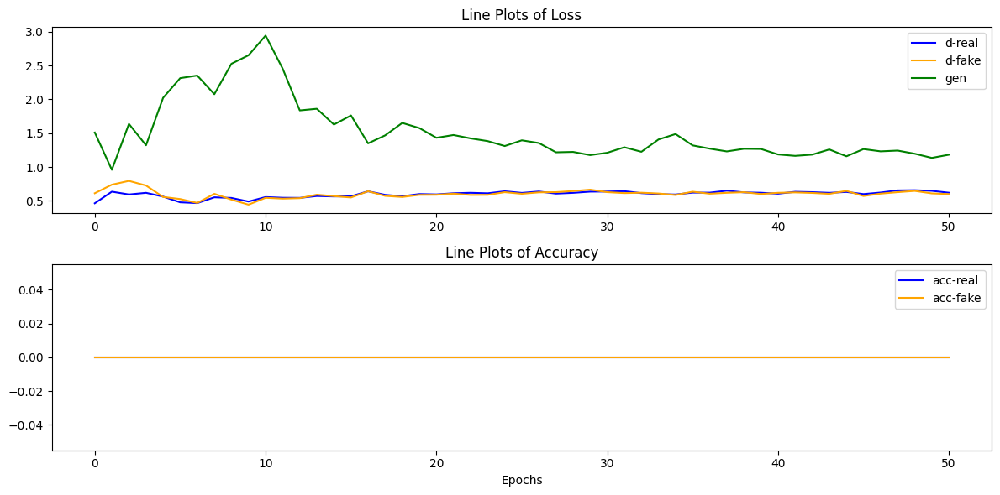

In [ ]:
## Build and train the model (RMSprop for discriminator optimizer)

latent_dim = 256
dataset_scaled = load_real_samples(scale=True)
combined_dataset = np.concatenate([dataset_scaled, augmented_data], axis=0)


train_gan(generator, discriminator, gan, combined_dataset, latent_dim, n_epochs=51)

Mode collapse seems to be a real problem: the generated images look extremely similar.

I tried GWAN as this is supposed to stabilize it but that just made them more noisy.

Another problem when mode collapse doesn't occur is that the images don't resemble anything similar to the input images. This could be because the learning dynamic between the two models (generator and discriminator) is unbalanced. When one model learns faster than the other, the images seem to get stuck in the "feature phase".

### Explanation of generator discriminator dynamic
Initial Stages of Training: At the very start of training, the generator typically produces random noise. The discriminator should have an easy job distinguishing the fake images from the real ones. As a result, the discriminator might become too powerful too quickly, pushing its loss towards zero.

Overpowering Discriminator: If the discriminator is too powerful, it might not provide meaningful gradients for the generator to learn. Essentially, the discriminator could say, "These generated images are all completely wrong" without providing more nuanced feedback that the generator can use to improve. In this scenario, the generator struggles to improve because the feedback it gets isn't helpful.

Vanishing Gradients: As a consequence of an overpowering discriminator, the generator might suffer from vanishing gradients. This means that the updates to the generator's weights during backpropagation are tiny, causing the generator to stop learning.

Mode Collapse: Another problem that can arise is mode collapse, where the generator finds one kind of image that seems to fool the discriminator and then overproduces variations of that image. The discriminator might still recognize these as fakes (keeping its accuracy high), but it can't guide the generator to produce a diverse set of more realistic images.

Balancing Act: Ideally, the discriminator and the generator should be somewhat matched in their capabilities, leading to a kind of equilibrium. If the discriminator is too good, the generator can't learn. If the generator is too good, the discriminator can't provide meaningful feedback.

Other Factors: Other factors like learning rates, model architectures, batch sizes, etc., can also impact how well the discriminator and generator are matched in capabilities. For instance, if the learning rate is too high, the models might keep overshooting optimal solutions.

# Code to test accuracy values for each batch

In [ ]:
# def train_gan(generator, discriminator, gan, dataset, latent_dim, n_epochs=20, batch_size=64, gen_updates=3):
#     batches_per_epoch = int(dataset.shape[0] / batch_size / 2)

#     d_real_losses, d_fake_losses, gen_losses = [], [], []
#     acc_real, acc_fake = [], []

#     orig_stdout = sys.stdout

#     for epoch in range(n_epochs):
#       for batch in range(batches_per_epoch):

#           # Train discriminator on real and fake images
#           X, y = get_batch(generator, dataset, batch_size=batch_size)
#           half_batch = batch_size // 2

#           # Redirecting stdout to suppress unwanted output from training
#           with open(os.devnull, 'w') as fnull:
#               old_stdout = sys.stdout
#               sys.stdout = fnull

#               d_real_loss = discriminator.train_on_batch(X[half_batch:], y[half_batch:])
#               d_fake_loss = discriminator.train_on_batch(X[:half_batch], y[:half_batch])

#           # Restore stdout
#           sys.stdout = old_stdout

#           d_real_losses.append(d_real_loss[0])
#           acc_real.append(d_real_loss[1])
#           d_fake_losses.append(d_fake_loss[0])
#           acc_fake.append(d_fake_loss[1])

#           # Print accuracies for the current batch
#           print(f"Epoch {epoch+1}/{n_epochs}, Batch {batch+1}/{batches_per_epoch}: Acc Real: {d_real_loss[1]*100:.6f}% | Acc Fake: {d_fake_loss[1]*100:.6f}%")

#           # 2) Train generator multiple times per discriminator update
#           with open(os.devnull, 'w') as fnull:
#               old_stdout = sys.stdout
#               sys.stdout = fnull

#               for _ in range(gen_updates):
#                   X_gan = np.random.randn(batch_size, latent_dim)
#                   y_gan = np.ones([batch_size, 1])
#                   generator_loss = gan.train_on_batch(X_gan, y_gan)
#                   gen_losses.append(generator_loss[0])

#           # Restore stdout
#           sys.stdout = old_stdout

#       if epoch % 10 == 0:
#           noise = np.random.randn(16, latent_dim)
#           images = generator.predict(noise)
#           grid_plot(images, epoch, name='GAN generated images', n=3, save=False, scale=True)

#     # Plotting the learning curves after training
#     plt.figure(figsize=(12, 6))

#     # Top subplot: Losses
#     plt.subplot(2, 1, 1)
#     plt.plot(d_real_losses, label="d-real", color='blue')
#     plt.plot(d_fake_losses, label="d-fake", color='orange')
#     plt.plot(gen_losses, label="gen", color='green')
#     plt.title("Line Plots of Loss")
#     plt.legend()

#     # Bottom subplot: Accuracies
#     plt.subplot(2, 1, 2)
#     plt.plot(acc_real, label="acc-real", color='blue')
#     plt.plot(acc_fake, label="acc-fake", color='orange')
#     plt.title("Line Plots of Accuracy")
#     plt.xlabel("Batches")
#     plt.legend()

#     plt.tight_layout()
#     plt.show()

# More complex models


In [ ]:
# from tensorflow.keras.layers import Dense, Flatten, Conv2D, Conv2DTranspose, Reshape, BatchNormalization, Activation, Dropout, UpSampling2D, LeakyReLU
# from tensorflow.keras import regularizers

# # Discriminator
# def build_conv_net(in_shape, out_shape, filters=128, out_activation='sigmoid'):
#     model = tf.keras.Sequential()

#     # Initial Conv layer
#     model.add(tf.keras.layers.Conv2D(filters, (5, 5), padding='same', kernel_regularizer=regularizers.l2(0.01), input_shape=in_shape))
#     model.add(tf.keras.layers.LeakyReLU(alpha=0.2))
#     model.add(tf.keras.layers.BatchNormalization())
#     model.add(tf.keras.layers.Conv2D(filters, (5, 5), strides=2, padding='same', kernel_regularizer=regularizers.l2(0.01)))
#     model.add(tf.keras.layers.LeakyReLU(alpha=0.2))
#     model.add(tf.keras.layers.Dropout(0.4))

#     # Add more layers with increased filters
#     for n_filters in [256, 512, 1024]:
#         model.add(tf.keras.layers.Conv2D(n_filters, (5, 5), padding='same', kernel_regularizer=regularizers.l2(0.01)))
#         model.add(tf.keras.layers.LeakyReLU(alpha=0.2))
#         model.add(tf.keras.layers.BatchNormalization())
#         model.add(tf.keras.layers.Conv2D(n_filters, (5, 5), strides=2, padding='same', kernel_regularizer=regularizers.l2(0.01)))
#         model.add(tf.keras.layers.LeakyReLU(alpha=0.2))
#         model.add(tf.keras.layers.Dropout(0.4))

#     model.add(tf.keras.layers.Flatten())
#     model.add(tf.keras.layers.Dense(out_shape, activation=out_activation))

#     model.summary()
#     return model

# #Generator
# def build_deconv_net(latent_dim, n_upsampling_layers=4, filters=512, activation_out='tanh'):
#     model = tf.keras.Sequential()

#     # Beginning layers starting from a 4x4 spatial dimension
#     model.add(Dense(4*4*1024, input_dim=latent_dim))  # Adjusted dense layer size
#     model.add(BatchNormalization(momentum=0.9))
#     model.add(Activation('relu'))
#     model.add(Reshape((4,4,1024)))
#     model.add(tf.keras.layers.Dropout(0.4))

#     # Upsampling layers with the provided structure
#     for _ in range(n_upsampling_layers):
#         model.add(UpSampling2D())
#         model.add(Conv2D(filters=filters, kernel_size=5, padding='same'))
#         model.add(BatchNormalization(momentum=0.9))
#         model.add(Activation('relu'))
#         model.add(Conv2D(filters=filters, kernel_size=5, padding='same'))
#         model.add(BatchNormalization(momentum=0.9))
#         model.add(Activation('relu'))

#         # Halve the number of filters for the next layer
#         filters //= 2
#         if filters < 64:  # Make sure it doesn't go below a certain threshold
#             filters = 64

#     # End layers
#     model.add(Conv2D(64, 5, padding='same'))
#     model.add(BatchNormalization(momentum=0.9))
#     model.add(Activation('relu'))

#     model.add(Conv2D(3, 5, padding='same'))
#     model.add(Activation(activation_out))

#     model.summary()
#     return model